<a target="_blank" href="https://colab.research.google.com/github/jmanuelc87/nmp-autoavanza/blob/main/notebooks/MontePiedad_EDA.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

# **Maestría en Inteligencia Artificial Aplicada**

## PROYECTO INTEGRADOR NACIONAL MONTE DE PIEDAD

#### **EQUIPO Tecnológico de Monterrey:**

* Renata Diaz Barreiro Castro         	A01018289
* Juan Manuel Carballo Montaño              	A01166758
* Ricardo Daniel Espinoza Castillo             A01139318


## AVANCE 1. ANÁLISIS EXPLORATORIO DE DATOS | VISIÓN: RECOLECCIÓN Y DIAGNÓSTICO VISUAL

VALIDACIÓN DE DOCUMENTOS (INE, FACTURA, TARJETA CIRCULACIÓN)
*   Contar cuántos documentos de cada tipo
*   Visualizar ejemplos de INE, factura, tarjeta
* Mejoramiento de imagenes, técnicas morfológicas
*   Extraer con OCR (aunque sea ruidoso)


# **INTRODUCCIÓN**

El proyecto AutoAvanza tiene como objetivo estimar el valor de un vehículo y validar los documentos de identidad del solicitante, a partir de datos no estructurados: imágenes de documentos oficiales (INE, factura, tarjeta de circulación) y fotografías del automóvil. Esta información es utilizada por Monte de Piedad para otorgar préstamos con garantía automotriz, sin que el cliente pierda el uso del vehículo.

Dado que los datos no son datos numéricos tradicionales, el análisis exploratorio en esta primera etapa se orienta al procesamiento de imágenes mediante técnicas de visión por computadora. En este notebook inicialmente haremos un análisis de las imágenes con las que se cuentan para saber de dónde estamos partiendo. Además comenzaremos a evaluar la calidad visual de los documentos y fotografías, aplicar métodos preliminares de mejora de imagen, y comenzar la extracción de texto mediante OCR, con el fin de identificar inconsistencias, ruido visual o información faltante.

Es importante señalar que Monte de Piedad quedó de enviarnos más datos durante la siguiente semana. Como se mostrará a continuación, la entrega actual de imágenes no ha sido estructurada y contamos con una cantidad limitada de datos, especialmente en lo que respecta a fotografías del vehículo. Por este motivo, el presente análisis se limitará a visualizar y explorar las imágenes correspondientes a documentos: factura, tarjeta de circulación e INE.

Este enfoque es coherente con las mejores prácticas en proyectos de visión computacional, donde el EDA busca asegurar que los datos visuales sean adecuados para su posterior procesamiento en tareas de clasificación, extracción, segmentación y análisis automatizado, que permitirán construir un modelo confiable de validación documental y estimación del valor del vehículo.

# **MAPEO INICIAL DE DATA SET DE IMAGENES MONTE DE PIEDAD**

En esta etapa inicial, se realizó un análisis exploratorio de los insumos visuales proporcionados por Monte de Piedad, los cuales consisten en imágenes de documentos y fotografías de vehículos.

TIPOS DE DOCUMENTOS
El total de archivos recibidos asciende a 164 documentos, distribuidos entre distintos tipos y formatos pero todos son PDF que contienen imagenes de documentos o de coches.  

Se clasifican en: 48 imágenes de facturas, 48 de credenciales INE, 48 de tarjetas de circulación, y 20 fotografías vehiculares (10 delanteras, 9 traseras y 1 lateral).

En términos de estructura documental, 94 archivos contienen una sola página (como el frente o reverso de un documento), mientras que 70 archivos contienen documentos de dos páginas (por ejemplo, frente y reverso en un solo PDF). Existen muchos tipos como ejemplo: INE_FRENTE, INE_REVERSO, FAC_FRENTE, TC_FRENTE, que son de una página o incluso que en una misma página tenga tanto frente como reverso INE_FREN&REV y también formatos combinados como INE_FREN&REV_2PAG o FACTURA_FREN&REV_2PAG.

ESTRUCTURA
* 12 CASOS INCOMPLETOS: se nos proporcionaron 12 carpetas correspondientes a diferentes prospectos. Cada carpeta contenía los tres documentos base (factura, INE y tarjeta de circulación) en sus versiones de anverso y reverso.
* 45 IMAGENES AISLADAS: se nos entregaron 45 archivos con condiciones visuales difíciles, divididos en 15 por tipo de documento (INE, factura y tarjeta de circulación), los cuales presentan retos comunes en escenarios reales como sombras, baja resolución, escaneo desalineado, etc.
* 10 CASOS COMPLETOS: se recibieron 10 casos completos que incluyen tanto los documentos como fotografías del vehículo (delantera y trasera), y una etiqueta que indica si el vehículo fue autorizado o rechazado para el préstamo. Este subconjunto es clave para futuras fases del proyecto relacionadas con predicción y evaluación automática del dictamen.

Este análisis preliminar es esencial para dimensionar la calidad, completitud y estructura de los datos disponibles, y sienta las bases para diseñar un pipeline robusto de visión por computadora enfocado en extracción, validación y estimación automatizada del valor vehicular.





# **Limpieza y organización inicial del dataset**

Como parte del proceso de preparación y limpieza de los datos, se ha optado por reorganizar los archivos recibidos en carpetas por caso, para facilitar su análisis y trazabilidad. Esta estructura contempla tres tipos de casos:

* 12 casos que contienen al menos los tres documentos principales: INE, Factura y Tarjeta de Circulación para una misma persona.

* 45 casos con un solo documento (ya sea INE, Factura o Tarjeta de Circulación).

* 10 casos completos, que además de los documentos incluyen fotografías del vehículo (delantera y trasera) y una etiqueta de autorización o rechazo.

Durante esta revisión inicial, identificamos que las decisiones de otorgar o no el préstamo no dependen únicamente de los documentos visibles en este dataset. Si bien es posible extraer variables útiles como el nombre y CURP del INE, o el modelo, marca y color del automóvil desde la factura, existen otros factores críticos considerados en sucursal para una valuación precisa. Entre estos se encuentran variables como el kilometraje real, estatus de robo, condición mecánica, entre otros, que no están actualmente disponibles en los datos entregados.



# **Acuerdos con Monte de Piedad & Plan alternativo**

Por lo anterior, se establecieron acuerdos con Monte de Piedad para la semana del 5 al 11 de mayo. Se acordó tener una reunión en línea con una persona que pueda validar y aprobar el acceso a información adicional, así como solicitar la ampliación del número de casos completos y etiquetados que incluyan todos los elementos clave del expediente (INE, factura, tarjeta de circulación y fotografías del vehículo). Además, se solicitó que, en la medida de lo posible, se incluyan variables adicionales que son relevantes para la valuación final del préstamo, como el kilometraje o el historial vehicular, ya que estas influyen significativamente en la decisión de autorizar o no un crédito.

En caso de que Monte de Piedad no logre compartir a tiempo los datos adicionales solicitados, especialmente los expedientes completos con etiquetas de aprobación o rechazo, se contempla un plan alternativo. Debido a que actualmente solo contamos con 10 casos completos, el entrenamiento de un modelo robusto sería inviable. Por ello, en la parte de validación documental se avanzará con los documentos disponibles (INE, factura y tarjeta de circulación), mientras que para la estimación del valor de los vehículos se utilizará una base de datos externa con más de 6,000 registros que contiene información estructurada como marca, modelo, año, odómetro y precio. Esto permitirá construir un modelo preliminar de valuación, el cual podrá ser refinado posteriormente una vez que se cuente con los datos propios de Monte de Piedad.

# **Análisis exploratorio para data set de imagenes**

A continuación, se realiza un análisis básico de las imágenes recibidas, incluyendo pruebas de extracción de texto, técnicas morfológicas y mejoramiento de imagen, con el objetivo de evaluar su viabilidad para etapas posteriores de procesamiento automático.

In [ ]:
import os
import cv2
import glob
import math
import fitz
import pytesseract as pyt

import numpy as np
import matplotlib.pyplot as plt

from transformers import pipeline
from PIL import Image, ImageOps

# Image Analysis (Personal ID front cover)

In [ ]:
images_pdfs = glob.glob('./data/bronze/*/INE_FRENTE.pdf')

Create a PNG image from each PDF page

In [ ]:
mat = fitz.Matrix(3, 3)

for i, pdf_path in enumerate(images_pdfs):
    doc = fitz.open(pdf_path)
    for page in doc:
        pix = page.get_pixmap(matrix=mat)
        name = os.path.basename(pdf_path).replace('.pdf', '')
        path = f'./data/silver/images/Caso {i+1}'
        if not os.path.exists(path):
            os.makedirs(path)
        pix.save(f'{path}/INE_FRENTE.png')

In [ ]:
images_paths = glob.glob('./data/silver/images/*/INE_FRENTE.png')

In [ ]:
images_np = []

for image_path in images_paths:
    image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    images_np.append(image)

Show the images in a grid

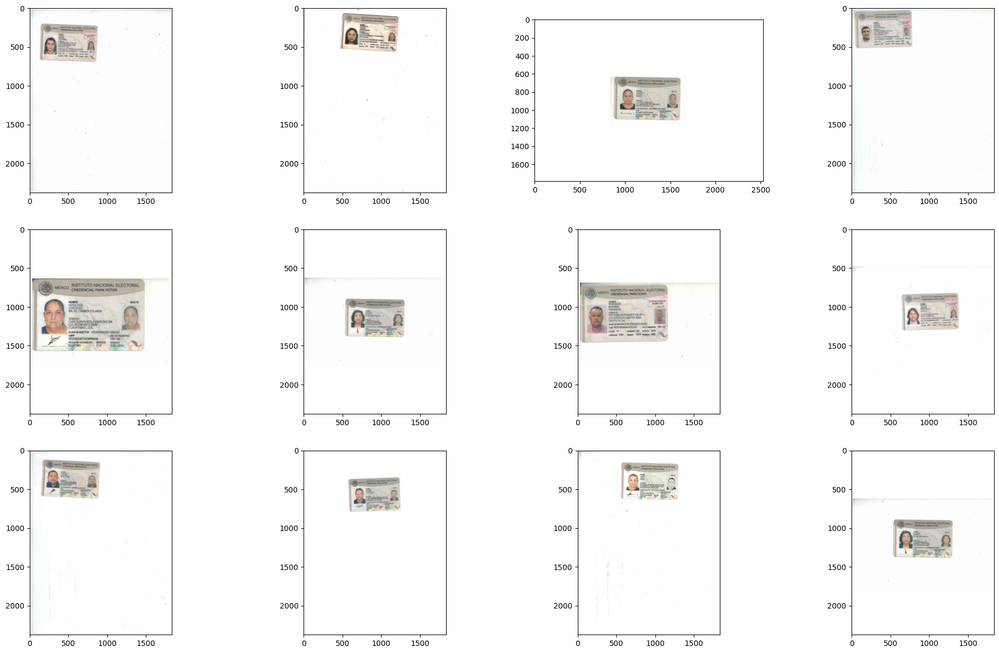

In [ ]:
x = math.ceil(math.sqrt(len(images_np)))

fig, axs = plt.subplots(x-1,x, figsize=(25,15))
axs = axs.flatten()
for i, image in enumerate(images_np):
    axs[i].imshow(image)

### Example pipeline with one image

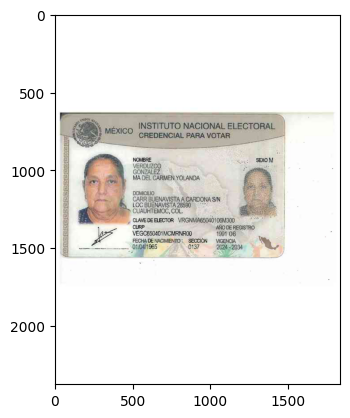

In [ ]:
image = images_np[4].copy()

plt.imshow(image, cmap='gray')

Convert to grayscale and perform a median blur to the image

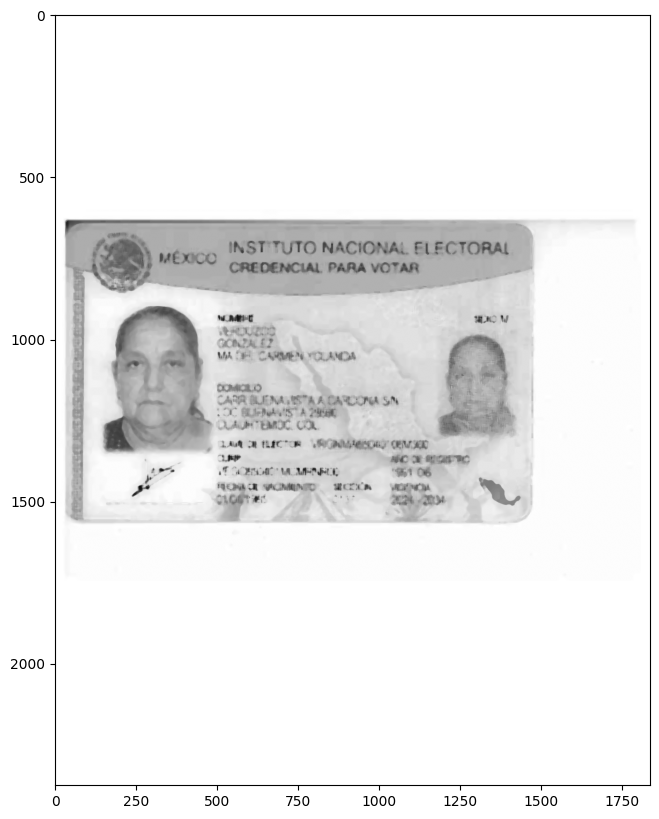

In [ ]:
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
blured = cv2.medianBlur(gray, ksize=11)

plt.figure(figsize=(10,10))
plt.imshow(blured, cmap='gray')

Threshold the image with OTSU and inverse binary

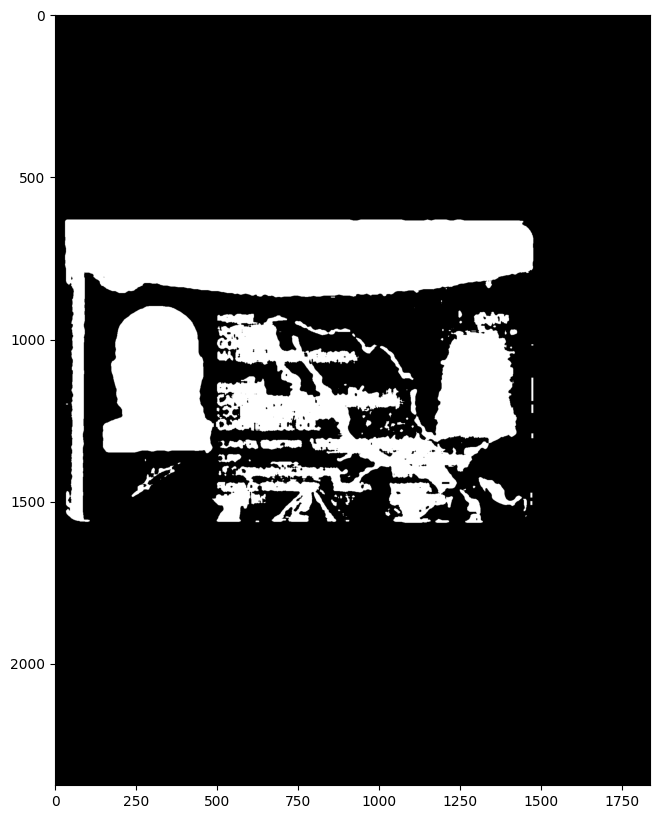

In [ ]:
_, thresh = cv2.threshold(blured, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

plt.figure(figsize=(10,10))
plt.imshow(thresh, cmap='gray')

Perform a morphology close operation using a rectangular kernel of 7x7

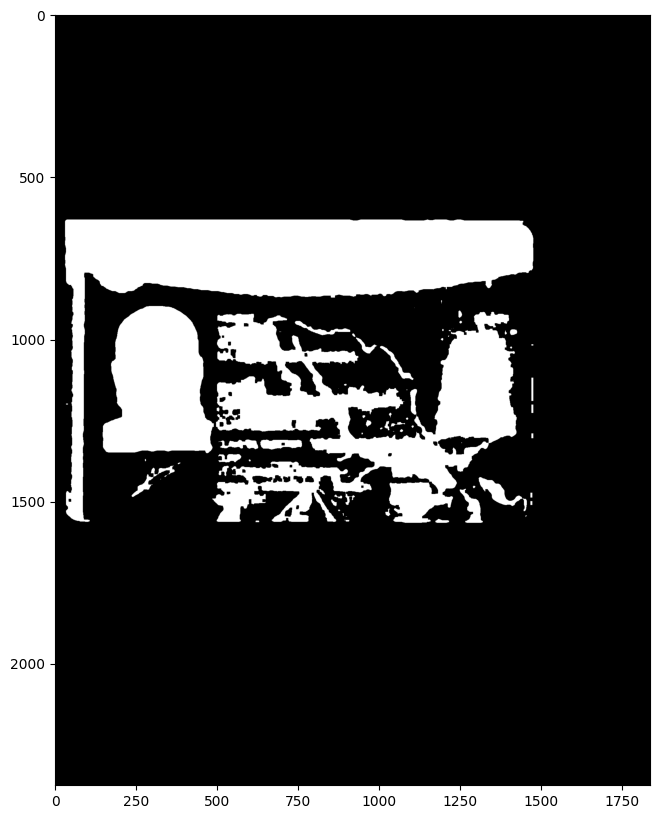

In [ ]:
close_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
close = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, close_kernel)

plt.figure(figsize=(10,10))
plt.imshow(close, cmap='gray')

Perform a dilate operation using a rectangular kernel of 7x7

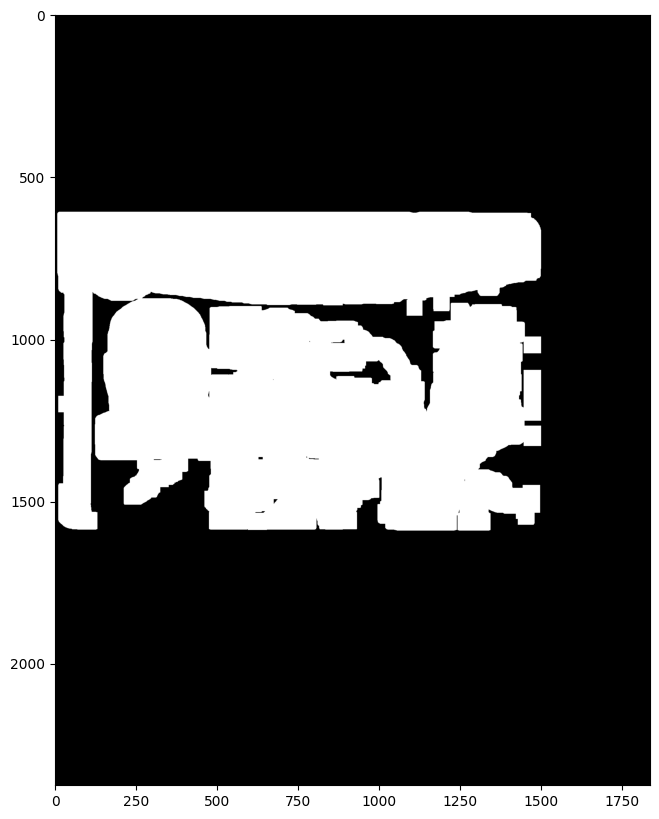

In [ ]:
dilate_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
dilate = cv2.dilate(close, dilate_kernel, iterations=8)

plt.figure(figsize=(10,10))
plt.imshow(dilate, cmap='gray')

- Find the contours of the previous image
- Select the largest contour
- Find the bounding rect of the largest contour

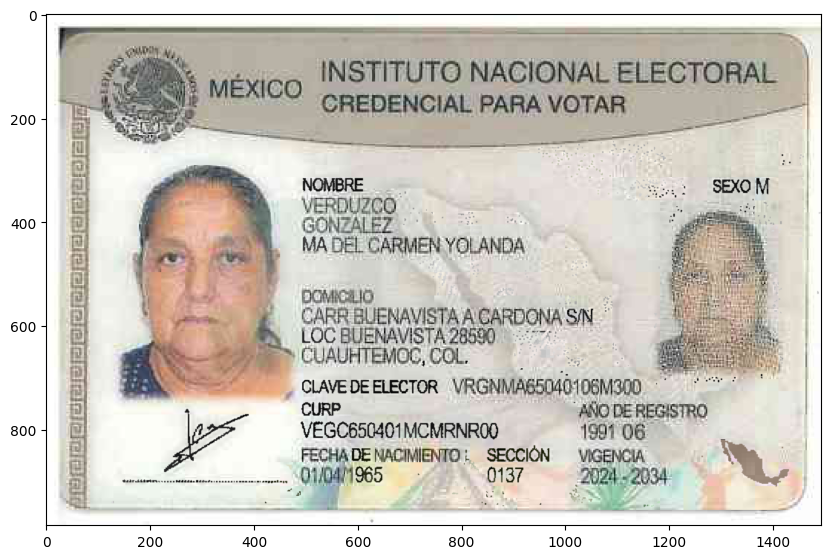

In [ ]:
image_contours = image.copy()

contours, hierarchy = cv2.findContours(dilate, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

contour_areas = [ (i, cv2.contourArea(contour)) for i, contour in enumerate(contours) ]

largest_contour = max(contour_areas, key=lambda x: x[1])

rect = cv2.boundingRect(contours[largest_contour[0]])

# cv2.rectangle(image_contours, (rect[0], rect[1]), (rect[0] + rect[2], rect[1] + rect[3]), (0,255,0), 3)

plt.figure(figsize=(10,10))
plt.imshow(image_contours[rect[1]:rect[1]+rect[3], rect[0]:rect[0]+rect[2]])

Apply the method for all the images

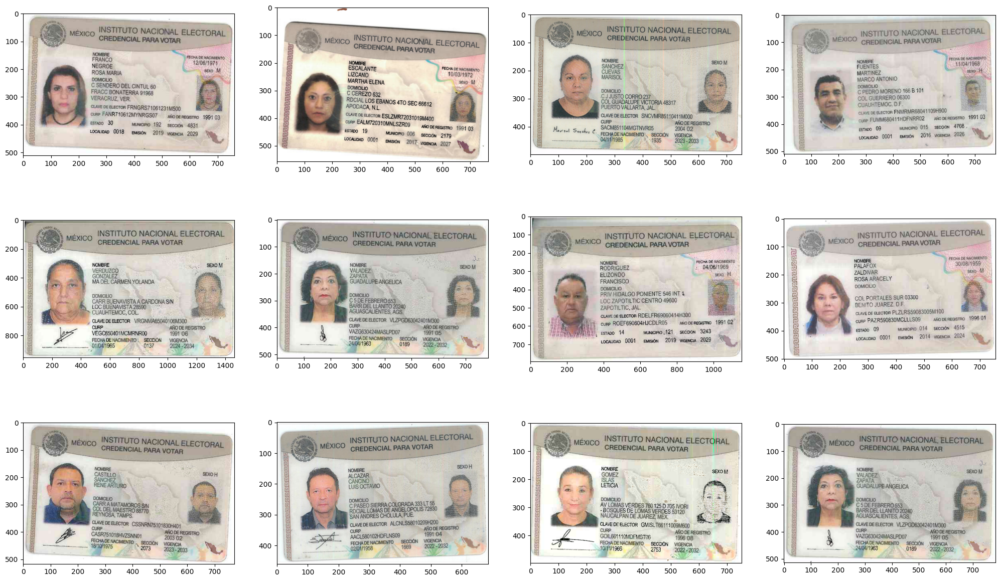

In [ ]:
x = math.ceil(math.sqrt(len(images_np)))

cropped_images = []

fig, axs = plt.subplots(x-1,x, figsize=(25,15))
axs = axs.flatten()

for i, image in enumerate(images_np):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    blured = cv2.medianBlur(gray, ksize=11)
    _, thresh = cv2.threshold(blured, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    close_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
    close = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, close_kernel, iterations=1)

    dilate_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
    dilate = cv2.dilate(close, dilate_kernel, iterations=8)

    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contour_areas = [ (i, cv2.contourArea(contour)) for i, contour in enumerate(contours) ]
    largest_contour = max(contour_areas, key=lambda x: x[1])
    rect = cv2.boundingRect(contours[largest_contour[0]])

    cropped = image[rect[1]+15:rect[1]+rect[3]-15, rect[0]+15:rect[0]+rect[2]-15].copy()
    cropped_images.append(cropped)

    axs[i].imshow(cropped)

Image size normalization

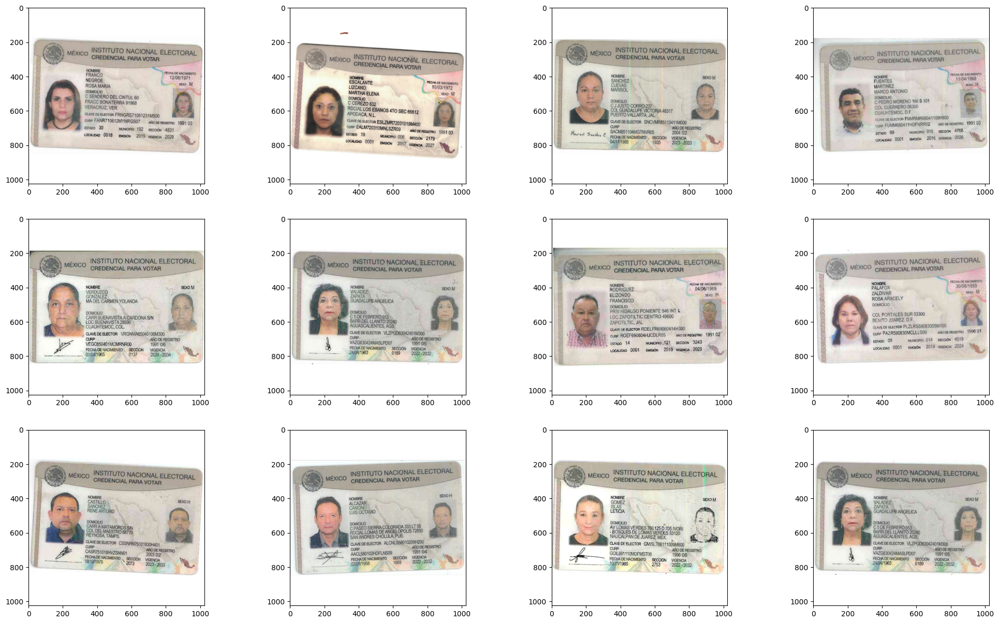

In [ ]:
fig, axs = plt.subplots(x-1,x, figsize=(25,15))
axs = axs.flatten()

SIZE = 1024

std_images = []

for i, image in enumerate(cropped_images):
    h,w,c = image.shape
    sized = Image.fromarray(image)
    sized = ImageOps.contain(sized, (SIZE, SIZE))
    sized = np.array(sized)
    s_h, s_w, _ = sized.shape

    backgroud = np.ones((SIZE, SIZE, 3), dtype=np.uint8) * 255
    c_y = round((backgroud.shape[0] - s_h) / 2)
    backgroud[c_y:c_y+s_h, 0:0+s_w, :] = sized.copy()

    if not os.path.exists(f'./data/silver/resized/Caso {i}'):
        os.makedirs(f'./data/silver/resized/Caso {i}')

    Image.fromarray(backgroud).save(f"./data/silver/resized/Caso {i}/INE_FRENTE.png", "PNG")

    std_images.append(backgroud)

    axs[i].imshow(backgroud)

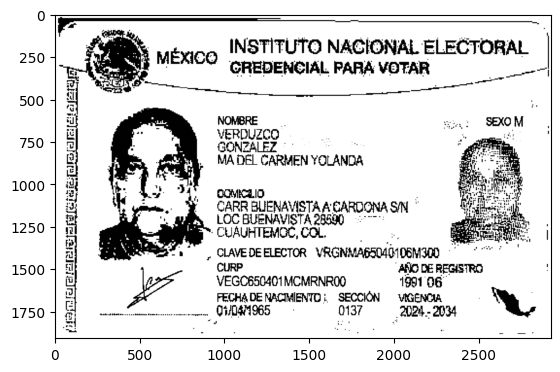

In [ ]:
ine_gray = cv2.cvtColor(cropped_images[4], cv2.COLOR_BGR2GRAY)
_, ine_thresh = cv2.threshold(ine_gray, 150, 255, cv2.THRESH_BINARY)
clahe_ine = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8)).apply(ine_thresh)
ine_upscaled = cv2.resize(clahe_ine, None, fx=2, fy=2, interpolation=cv2.INTER_LINEAR)

plt.imshow(ine_upscaled, cmap='gray')

# Image Analysis (Personal ID back cover)

In [ ]:
images_pdfs = glob.glob('./data/bronze/*/INE_REVERSO.pdf')

In [ ]:
mat = fitz.Matrix(3, 3)

for i, pdf_path in enumerate(images_pdfs):
    doc = fitz.open(pdf_path)
    for page in doc:
        pix = page.get_pixmap(matrix=mat)
        name = os.path.basename(pdf_path).replace('.pdf', '')
        path = f'./data/silver/images/Caso {i+1}'
        if not os.path.exists(path):
            os.makedirs(path)
        pix.save(f'{path}/INE_REVERSO.png')

In [ ]:
images_paths = glob.glob('./data/silver/images/*/INE_REVERSO.png')

In [ ]:
images_np = []

for image_path in images_paths:
    image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    images_np.append(image)

Show images in a grid

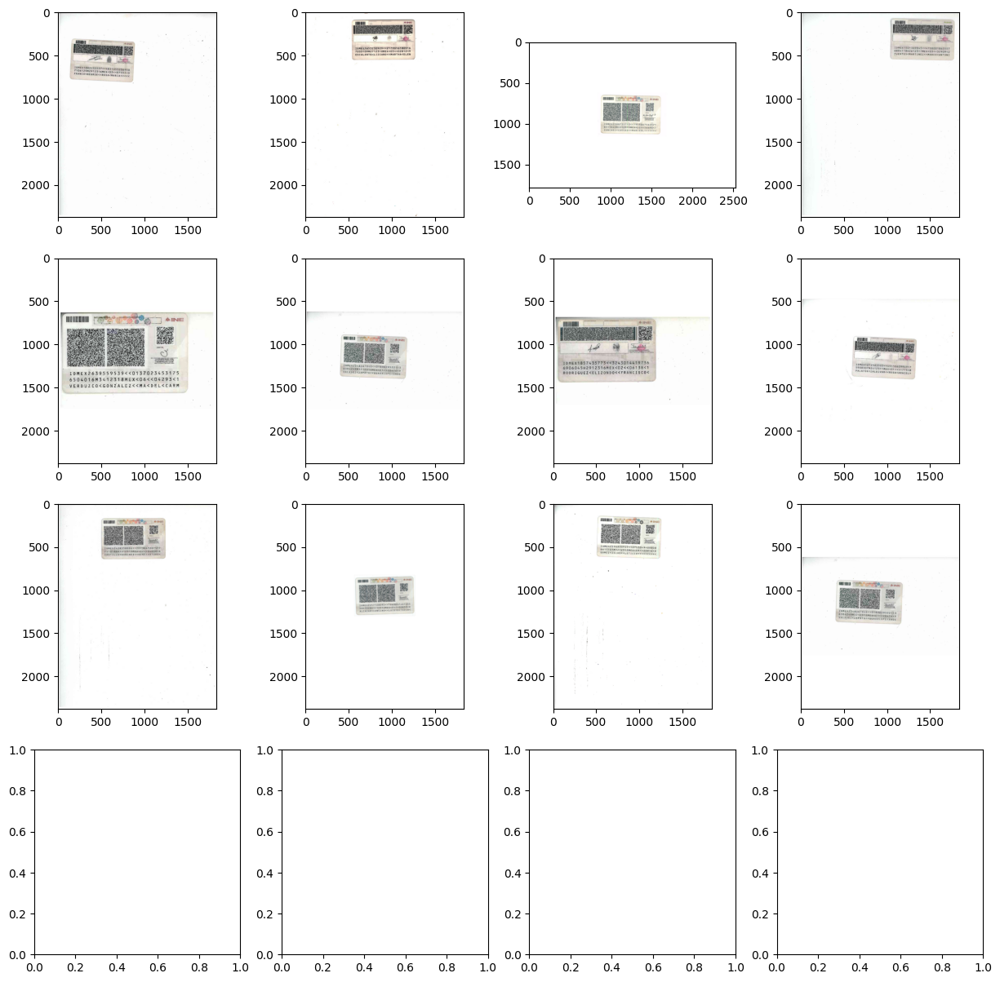

In [ ]:
x = math.ceil(math.sqrt(len(images_np)))

fig, axs = plt.subplots(x,x, figsize=(15,15))
axs = axs.flatten()
for i, image in enumerate(images_np):
    axs[i].imshow(image)

### Example pipeline with one image

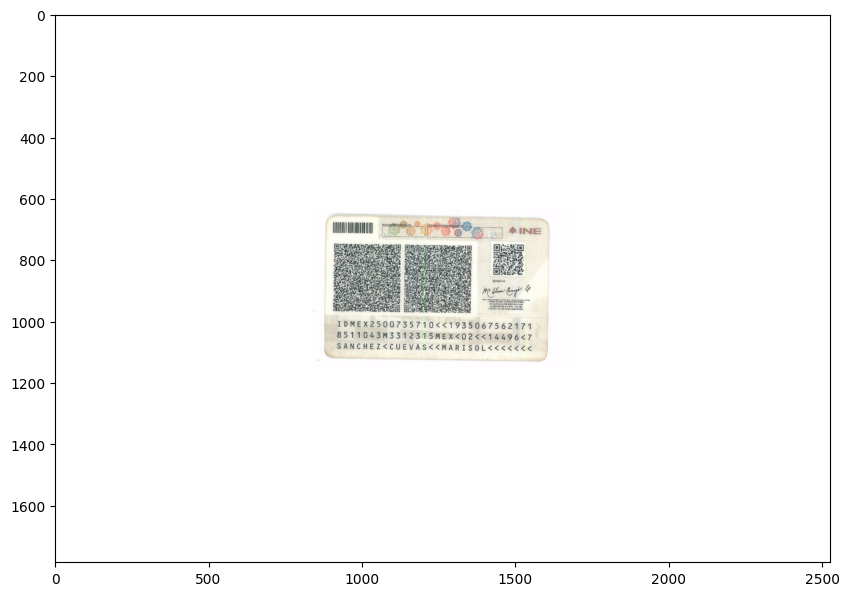

In [ ]:
image = images_np[2]

plt.figure(figsize=(10,10))
plt.imshow(image)

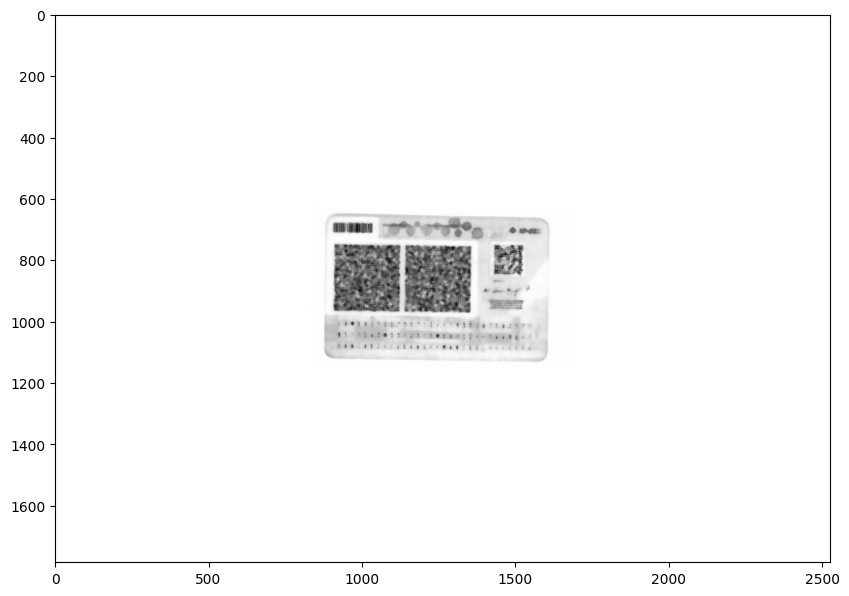

In [ ]:
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
blured = cv2.medianBlur(gray, ksize=11)

plt.figure(figsize=(10,10))
plt.imshow(blured, cmap='gray')

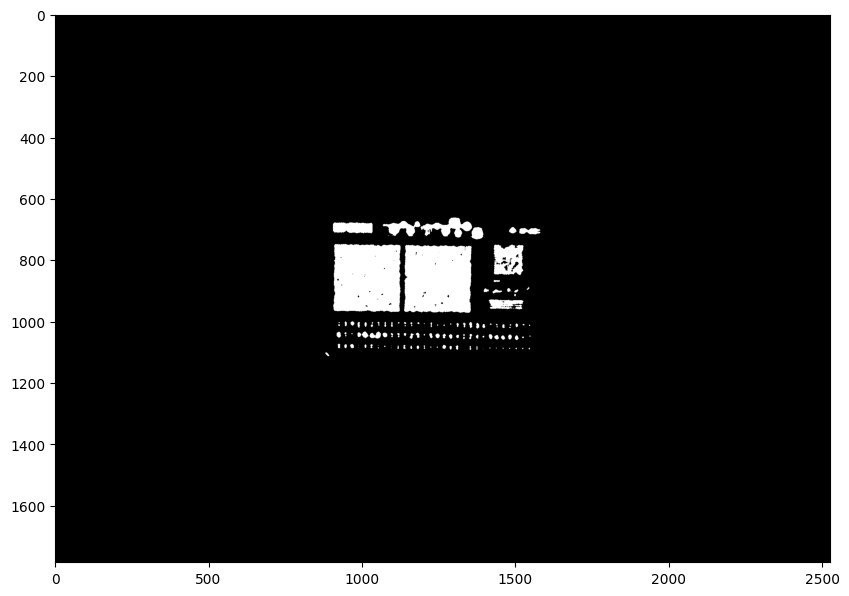

In [ ]:
_, thresh = cv2.threshold(blured, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

plt.figure(figsize=(10,10))
plt.imshow(thresh, cmap='gray')

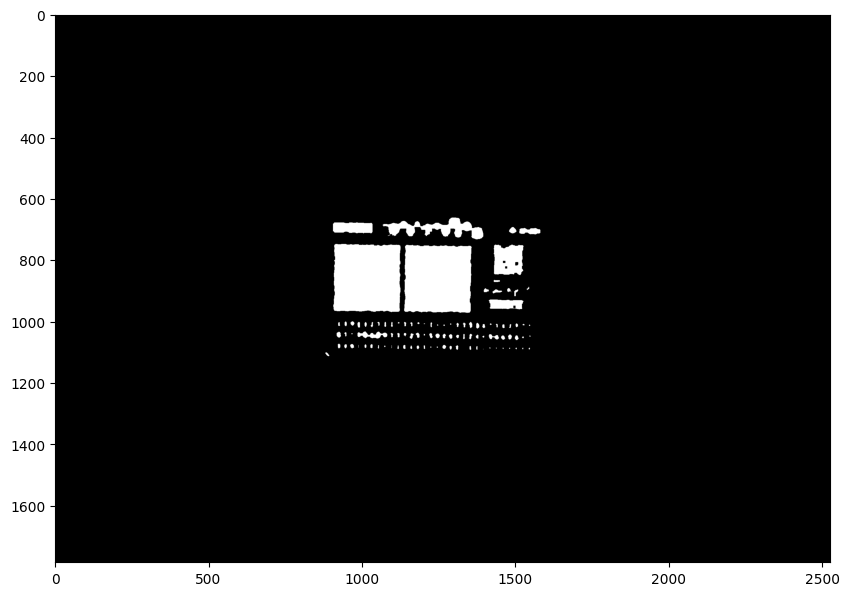

In [ ]:
close_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
close = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, close_kernel)

plt.figure(figsize=(10,10))
plt.imshow(close, cmap='gray')

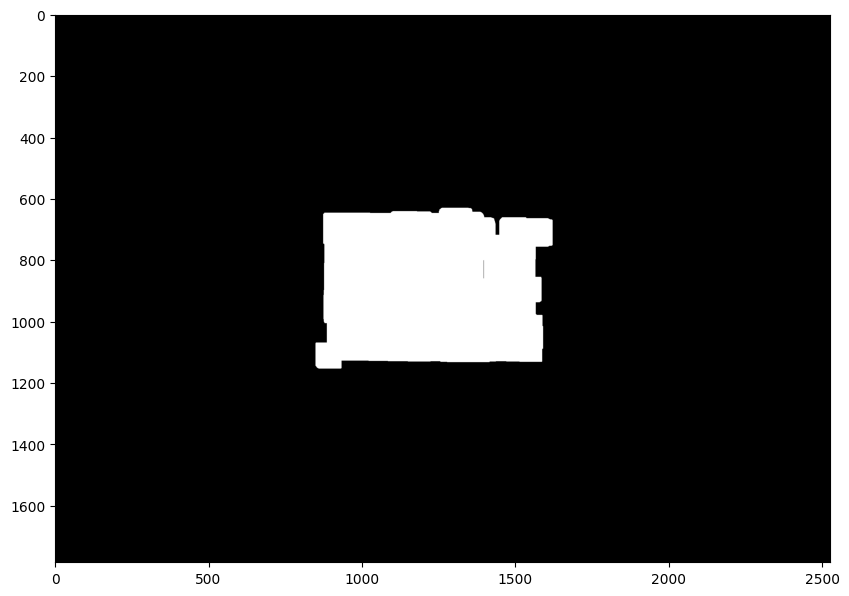

In [ ]:
dilate_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (10,10))
dilate = cv2.dilate(close, dilate_kernel, iterations=8)

plt.figure(figsize=(10,10))
plt.imshow(dilate, cmap='gray')

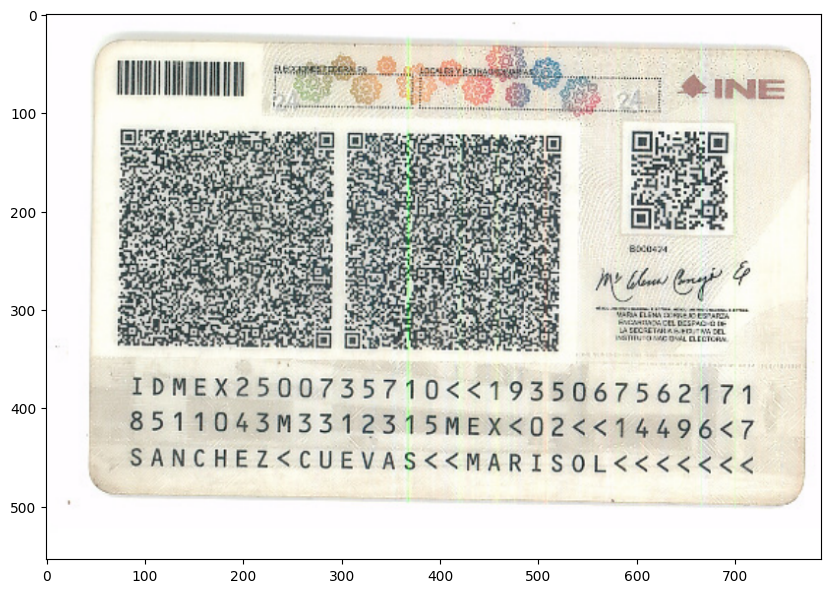

In [ ]:
image_contours = image.copy()

contours, hierarchy = cv2.findContours(dilate, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

contour_areas = [ (i, cv2.contourArea(contour)) for i, contour in enumerate(contours) ]

largest_contour = max(contour_areas, key=lambda x: x[1])

rect = cv2.boundingRect(contours[largest_contour[0]])

# for contour in contours:
#     rect = cv2.boundingRect(contour)
#     cv2.rectangle(image_contours, (rect[0], rect[1]), (rect[0] + rect[2], rect[1] + rect[3]), (0,255,0), 2)

plt.figure(figsize=(10,10))
# plt.imshow(image_contours)
plt.imshow(image_contours[rect[1]:rect[1]+rect[3]+30, rect[0]-15:rect[0]+rect[2]])

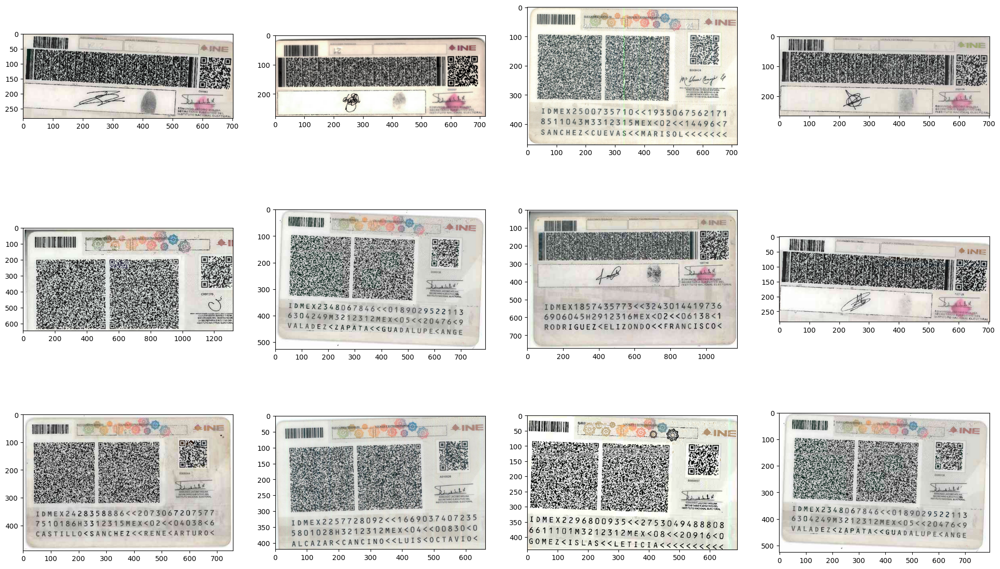

In [ ]:
x = math.ceil(math.sqrt(len(images_np)))

cropped_images = []

fig, axs = plt.subplots(x-1,x, figsize=(25,15))
axs = axs.flatten()

for i, image in enumerate(images_np):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    blured = cv2.medianBlur(gray, ksize=11)
    _, thresh = cv2.threshold(blured, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    close_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
    close = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, close_kernel, iterations=1)

    dilate_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
    dilate = cv2.dilate(close, dilate_kernel, iterations=8)

    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contour_areas = [ (i, cv2.contourArea(contour)) for i, contour in enumerate(contours) ]
    largest_contour = max(contour_areas, key=lambda x: x[1])
    rect = cv2.boundingRect(contours[largest_contour[0]])

    cropped = image[rect[1]+15:rect[1]+rect[3]-15, rect[0]+15:rect[0]+rect[2]-15].copy()
    cropped_images.append(cropped)

    axs[i].imshow(cropped)

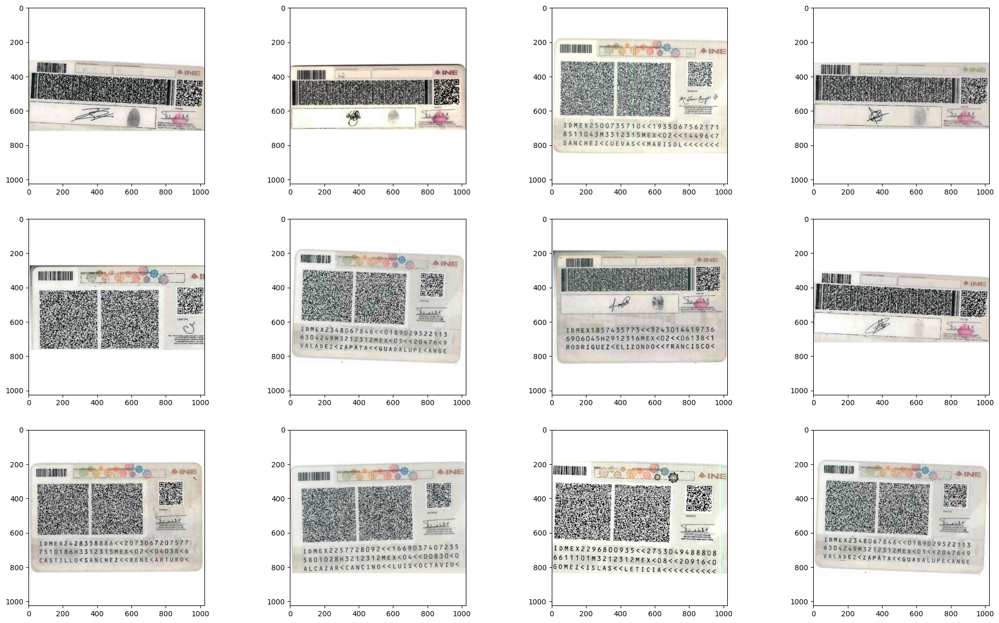

In [ ]:
fig, axs = plt.subplots(x-1,x, figsize=(25,15))
axs = axs.flatten()

SIZE = 1024

std_images = []

for i, image in enumerate(cropped_images):
    h,w,c = image.shape
    sized = Image.fromarray(image)
    sized = ImageOps.contain(sized, (SIZE, SIZE))
    sized = np.array(sized)
    s_h, s_w, _ = sized.shape

    backgroud = np.ones((SIZE, SIZE, 3), dtype=np.uint8) * 255
    c_y = round((backgroud.shape[0] - s_h) / 2)
    backgroud[c_y:c_y+s_h, 0:0+s_w, :] = sized.copy()

    Image.fromarray(backgroud).save(f"./data/silver/resized/Caso {i}/INE_REVERSO.png", "PNG")

    std_images.append(backgroud)

    axs[i].imshow(backgroud)

# Image Analysis (Car Invoice)

In [ ]:
images_pdfs = glob.glob('./data/bronze/*/FAC_FRENTE.pdf')

In [ ]:
mat = fitz.Matrix(5, 5)

for i, pdf_path in enumerate(images_pdfs):
    doc = fitz.open(pdf_path)
    for page in doc:
        pix = page.get_pixmap(matrix=mat)
        name = os.path.basename(pdf_path).replace('.pdf', '')
        path = f'./data/silver/images/Caso {i+1}'
        if not os.path.exists(path):
            os.makedirs(path)
        pix.save(f'{path}/FAC_FRENTE.png')

In [ ]:
images_paths = glob.glob('./data/silver/images/*/FAC_FRENTE.png')

In [ ]:
images_np = []

for image_path in images_paths:
    image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    images_np.append(image)

[ WARN:0@22.597] global grfmt_png.cpp:695 read_chunk chunk data is too large


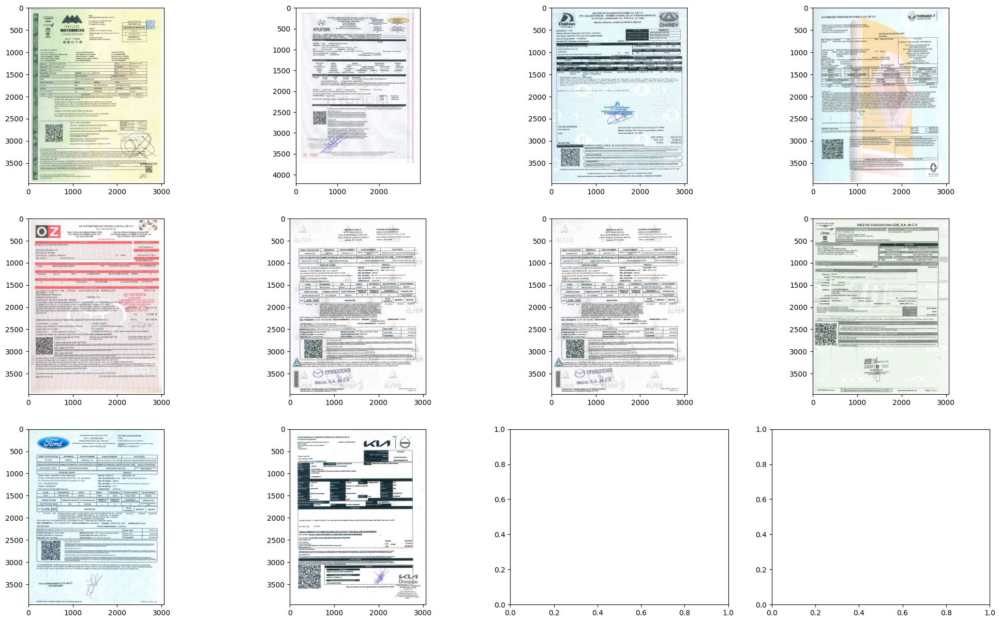

In [ ]:
x = math.ceil(math.sqrt(len(images_np)))

fig, axs = plt.subplots(x-1,x, figsize=(25,15))
axs = axs.flatten()
for i, image in enumerate(images_np):
    axs[i].imshow(image)

(<matplotlib.image.AxesImage at 0x37fb06560>, (3960, 3060))

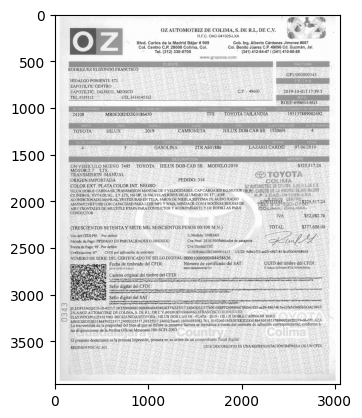

In [ ]:
image = cv2.cvtColor(images_np[4].copy(), cv2.COLOR_RGB2GRAY)

plt.imshow(image, cmap='gray'), image.shape

(<matplotlib.image.AxesImage at 0x37fba5e10>, (3960, 3060))

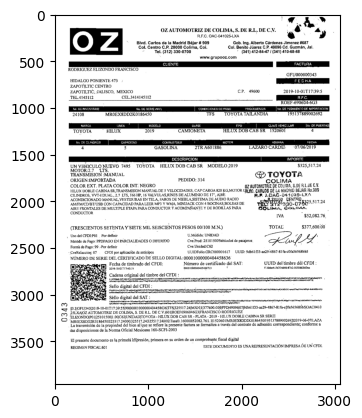

In [ ]:
_, image_otsu = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

plt.imshow(image_otsu, cmap='gray'), image.shape

# **Extracción Factura**

In [ ]:
parsed_text = pyt.image_to_string(image_otsu, lang='spa', output_type=pyt.Output.DICT)
print(parsed_text['text'])

0343

OZ AUTOMOTRIZ DE COLIMA, $. DE R.L, DE C.Y. LA $ es
R.F.C. OAC-041025-LXA | on o po

> Blvd. Carlos de la Madrid Béjar H* 909 Gob. Ing. Alberto Cárdenas Jimenez $687
Col. Centro C.P. 28000 Colima, Col. Col. Benito Júarez C.P. 49096 Cd. Guzmán, Jal.
7 Tel. (312) 330-0700 * (341) 412-8447 / (341) 410-68-88
> wWW.grupooz.com

RODRIGUEZ ELIZONDO FRANCISCO
-GFU000000343

HIDALGO PONIENTE 473 ;
ZAPOTILTIC CENTRO
ZAPOTILTIC; JALISCO, MEXICO C.P. 49600 2019-10-01T17:39:5
TEL.4145112 CEL.3414145112 o REC.

ROEF-690604-6G3
a. DE SERIE 1147) CONDICIONES DE-PÁGO PROCEDENCIA No DE PEDIMENTO DE IMPORTACION
TFS  TOYOTATAILANDIA  -  195137889002692

No. DE INVENTARIO

24108 MR0EX8DD2K0186450

MARCA LINEA MODELA FP ELAvE VEHICULAR [Mo DE PUERTAS

TOYOTA " HILUX 2019 CAMIONETA HILUX DOB-CAB SR 1520601 4

COMBUETIBLE MOTOR ADUANA FECHA

2TR A601886. LAZARO CARDE! — :07/06/2019

No DE CILINDROS CAPACIDAD

4 GASOLINA

DESCRIPCIÓN j | IMPORTE

UN VEHICULO NUEVO 7495 TOYOTA HILUX DOB-CAB SR MODELO 2019

In [ ]:
model_id = "google/gemma-3-1b-it"

pipe_llm = pipeline(task="text-generation", model=model_id)

Device set to use mps:0


In [ ]:
question = "Cual es la marca y modelo del vehiculo?"
messages = [
    [
        {
            "role": "system",
            "content": [{"type": "text", "text": "Eres un asistente servicial, tus respuestas son concisas, si no sabes algo responde no se."},]
        },
        {
            "role": "user",
            "content": [{"type": "text", "text": parsed_text['text']}, {"type": "text", "text": f"{question}"},]
        }
    ],
]
messages

[[{'role': 'system',
   'content': [{'type': 'text',
     'text': 'Eres un asistente servicial, tus respuestas son concisas, si no sabes algo responde no se.'}]},
  {'role': 'user',
   'content': [{'type': 'text',
     'text': '0343\n\nOZ AUTOMOTRIZ DE COLIMA, $. DE R.L, DE C.Y. LA $ es\nR.F.C. OAC-041025-LXA | on o po\n\n> Blvd. Carlos de la Madrid Béjar H* 909 Gob. Ing. Alberto Cárdenas Jimenez $687\nCol. Centro C.P. 28000 Colima, Col. Col. Benito Júarez C.P. 49096 Cd. Guzmán, Jal.\n7 Tel. (312) 330-0700 * (341) 412-8447 / (341) 410-68-88\n> wWW.grupooz.com\n\nRODRIGUEZ ELIZONDO FRANCISCO\n-GFU000000343\n\nHIDALGO PONIENTE 473 ;\nZAPOTILTIC CENTRO\nZAPOTILTIC; JALISCO, MEXICO C.P. 49600 2019-10-01T17:39:5\nTEL.4145112 CEL.3414145112 o REC.\n\nROEF-690604-6G3\na. DE SERIE 1147) CONDICIONES DE-PÁGO PROCEDENCIA No DE PEDIMENTO DE IMPORTACION\nTFS  TOYOTATAILANDIA  -  195137889002692\n\nNo. DE INVENTARIO\n\n24108 MR0EX8DD2K0186450\n\nMARCA LINEA MODELA FP ELAvE VEHICULAR [Mo DE PUERTAS\n

In [ ]:
output = pipe_llm(messages)

In [ ]:
output[0][0]['generated_text'][-1]

{'role': 'assistant', 'content': 'El vehículo es un Toyota Hilux 2019.'}

In [ ]:
question = "Cual es la fecha de compra del vehiculo?"
messages = [
    [
        {
            "role": "system",
            "content": [{"type": "text", "text": "Eres un asistente servicial, tus respuestas son concisas, si no sabes algo responde no se."},]
        },
        {
            "role": "user",
            "content": [{"type": "text", "text": parsed_text['text']}, {"type": "text", "text": f"{question}"},]
        }
    ],
]
messages

[[{'role': 'system',
   'content': [{'type': 'text',
     'text': 'Eres un asistente servicial, tus respuestas son concisas, si no sabes algo responde no se.'}]},
  {'role': 'user',
   'content': [{'type': 'text',
     'text': '0343\n\nOZ AUTOMOTRIZ DE COLIMA, $. DE R.L, DE C.Y. LA $ es\nR.F.C. OAC-041025-LXA | on o po\n\n> Blvd. Carlos de la Madrid Béjar H* 909 Gob. Ing. Alberto Cárdenas Jimenez $687\nCol. Centro C.P. 28000 Colima, Col. Col. Benito Júarez C.P. 49096 Cd. Guzmán, Jal.\n7 Tel. (312) 330-0700 * (341) 412-8447 / (341) 410-68-88\n> wWW.grupooz.com\n\nRODRIGUEZ ELIZONDO FRANCISCO\n-GFU000000343\n\nHIDALGO PONIENTE 473 ;\nZAPOTILTIC CENTRO\nZAPOTILTIC; JALISCO, MEXICO C.P. 49600 2019-10-01T17:39:5\nTEL.4145112 CEL.3414145112 o REC.\n\nROEF-690604-6G3\na. DE SERIE 1147) CONDICIONES DE-PÁGO PROCEDENCIA No DE PEDIMENTO DE IMPORTACION\nTFS  TOYOTATAILANDIA  -  195137889002692\n\nNo. DE INVENTARIO\n\n24108 MR0EX8DD2K0186450\n\nMARCA LINEA MODELA FP ELAvE VEHICULAR [Mo DE PUERTAS\n

In [ ]:
output = pipe_llm(messages)

In [ ]:
output[0][0]['generated_text']

[{'role': 'system',
  'content': [{'type': 'text',
    'text': 'Eres un asistente servicial, tus respuestas son concisas, si no sabes algo responde no se.'}]},
 {'role': 'user',
  'content': [{'type': 'text',
    'text': '0343\n\nOZ AUTOMOTRIZ DE COLIMA, $. DE R.L, DE C.Y. LA $ es\nR.F.C. OAC-041025-LXA | on o po\n\n> Blvd. Carlos de la Madrid Béjar H* 909 Gob. Ing. Alberto Cárdenas Jimenez $687\nCol. Centro C.P. 28000 Colima, Col. Col. Benito Júarez C.P. 49096 Cd. Guzmán, Jal.\n7 Tel. (312) 330-0700 * (341) 412-8447 / (341) 410-68-88\n> wWW.grupooz.com\n\nRODRIGUEZ ELIZONDO FRANCISCO\n-GFU000000343\n\nHIDALGO PONIENTE 473 ;\nZAPOTILTIC CENTRO\nZAPOTILTIC; JALISCO, MEXICO C.P. 49600 2019-10-01T17:39:5\nTEL.4145112 CEL.3414145112 o REC.\n\nROEF-690604-6G3\na. DE SERIE 1147) CONDICIONES DE-PÁGO PROCEDENCIA No DE PEDIMENTO DE IMPORTACION\nTFS  TOYOTATAILANDIA  -  195137889002692\n\nNo. DE INVENTARIO\n\n24108 MR0EX8DD2K0186450\n\nMARCA LINEA MODELA FP ELAvE VEHICULAR [Mo DE PUERTAS\n\nTOYO

# **Extraccion INE**

In [ ]:
parsed_text = pyt.image_to_string(ine_upscaled, lang='spa', output_type=pyt.Output.DICT)
print(parsed_text['text'])

0

papa [ent

CP AÑO DE REGISTRO
yd VEGO850401MCMRNROO 1501 06

méxico INSTITUTO NACIONAL ELECTORAL
GREDENCIAL PARA VOTAR a

NOMBRE a

VERDUZLO
GONZALEZ

MA DEL CARMEN YOLANDA

DOMBAIO
CARR BUENA MISTA A LARUONA S/N *
gs LOCBUENAVISTA 28590

Ma” CUAUHTEMOC, COL,

, CLAVE DE ELECTOR VRGNMABSOIÓ1 DGMSDO

FECHA DE MACIMIENTO : SECCIÓN — VIGENCIA
mm. OHD4M96S > 0137 2024-20%




In [ ]:
question = "Cual es el nombre de la persona?"
messages = [
    [
        {
            "role": "system",
            "content": [{"type": "text", "text": "Eres un asistente servicial, tus respuestas son concisas, si no sabes algo responde no se."},]
        },
        {
            "role": "user",
            "content": [{"type": "text", "text": parsed_text['text']}, {"type": "text", "text": f"{question}"},]
        }
    ],
]
messages

[[{'role': 'system',
   'content': [{'type': 'text',
     'text': 'Eres un asistente servicial, tus respuestas son concisas, si no sabes algo responde no se.'}]},
  {'role': 'user',
   'content': [{'type': 'text',
     'text': '0\n\npapa [ent\n\nCP AÑO DE REGISTRO\nyd VEGO850401MCMRNROO 1501 06\n\nméxico INSTITUTO NACIONAL ELECTORAL\nGREDENCIAL PARA VOTAR a\n\nNOMBRE a\n\nVERDUZLO\nGONZALEZ\n\nMA DEL CARMEN YOLANDA\n\nDOMBAIO\nCARR BUENA MISTA A LARUONA S/N *\ngs LOCBUENAVISTA 28590\n\nMa” CUAUHTEMOC, COL,\n\n, CLAVE DE ELECTOR VRGNMABSOIÓ1 DGMSDO\n\nFECHA DE MACIMIENTO : SECCIÓN — VIGENCIA\nmm. OHD4M96S > 0137 2024-20%\n\n'},
    {'type': 'text', 'text': 'Cual es el nombre de la persona?'}]}]]

In [ ]:
output = pipe_llm(messages)

In [ ]:
output[0][0]['generated_text']

[{'role': 'system',
  'content': [{'type': 'text',
    'text': 'Eres un asistente servicial, tus respuestas son concisas, si no sabes algo responde no se.'}]},
 {'role': 'user',
  'content': [{'type': 'text',
    'text': '0\n\npapa [ent\n\nCP AÑO DE REGISTRO\nyd VEGO850401MCMRNROO 1501 06\n\nméxico INSTITUTO NACIONAL ELECTORAL\nGREDENCIAL PARA VOTAR a\n\nNOMBRE a\n\nVERDUZLO\nGONZALEZ\n\nMA DEL CARMEN YOLANDA\n\nDOMBAIO\nCARR BUENA MISTA A LARUONA S/N *\ngs LOCBUENAVISTA 28590\n\nMa” CUAUHTEMOC, COL,\n\n, CLAVE DE ELECTOR VRGNMABSOIÓ1 DGMSDO\n\nFECHA DE MACIMIENTO : SECCIÓN — VIGENCIA\nmm. OHD4M96S > 0137 2024-20%\n\n'},
   {'type': 'text', 'text': 'Cual es el nombre de la persona?'}]},
 {'role': 'assistant',
  'content': 'El nombre de la persona es Carmen Yolanda Durvezo.'}]